# FACS analysis: lentiviral transduction (24h,38h)
* transduction: made virus by tranfect in 10 cm plates: LV expression plasmid, pSPAX2, VSV-G (10:9:1 ratio). Use 1ml fresh to transduce. 24 hours post transduction, passage to 15 cm plate.  40 hours post transduction, select in 15 cm plate w/ 2 ug/ml puro. After 24 h selection was complete (no untransduced cells alive), passage to 6 well plates for replicate starvation measurement.
* plasmid reporters 1)YFP-WT: Flag-YFPwt-DHFRwt or 2) YFP-CGG: Flag-YFPcgg-DHFRcgg
* collected 30,000 events for each sample.  Parameters: FSC = 231, SSC = 212, FITC = 280 (lower for transient transfection exp)

## Analysis 1 : consider mean of fcs/ssc gated population of 30000 events after 24 h starvation ##

1) thresholding for reasonable FSC/SSC values and NO fluorescence value based thresholding, 
2) plus "no tmp" subtraction,
3) plus rich condition normalization ## 

In [1]:
%pylab inline
import matplotlib.pyplot as plt
from FlowCytometryTools import FCMeasurement
import pandas
import numpy
from IPython.core.display import HTML
from matplotlib.ticker import MaxNLocator, LogLocator, AutoMinorLocator # custom tick locators for plots

# matplotlib default customizations
import matplotlib as mpl
mpl.rcParams['lines.linewidth'] = 1
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color = ['blue','green','red',
                                           'cyan','magenta','yellow','olive',
                                          'orange', 'palegreen','black',])
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['figure.subplot.hspace'] = 0.5
mpl.rcParams['figure.subplot.wspace'] = 0.5
mpl.rcParams['font.size'] = 8
mpl.rcParams['font.sans-serif'] = 'Arial'
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8
mpl.rcParams['legend.fontsize'] = 8
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.direction'] = 'out'
mpl.rcParams['pdf.compression'] = 0
mpl.rcParams['pdf.fonttype'] = 42

/Users/aliciadarnell/anaconda2/envs/py27/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


Populating the interactive namespace from numpy and matplotlib


In [3]:
sampleids = {1: 'YFP-WT Rich TMP 1',
 2: 'YFP-WT -Leu TMP 1',
 3: 'YFP-WT -Arg TMP 1',
 4: 'YFP-CGG Rich TMP 1',
 5: 'YFP-CGG -Leu TMP 1',
 6: 'YFP-CGG -Arg TMP 1',
 7: 'YFP-WT Rich TMP 2',
 8: 'YFP-WT -Leu TMP 2',
 9: 'YFP-WT -Arg TMP 2',
 10: 'YFP-CGG Rich TMP 2',
 11: 'YFP-CGG -Leu TMP 2',
 12: 'YFP-CGG -Arg TMP 2',
 13: 'YFP-WT Rich TMP 3',
 14: 'YFP-WT -Leu TMP 3',
 15: 'YFP-WT -Arg TMP 3',
 16: 'YFP-CGG Rich TMP 3',
 17: 'YFP-CGG -Leu TMP 3',
 18: 'YFP-CGG -Arg TMP 3',
 19: 'YFP-WT Rich NOTMP 1',
 20: 'YFP-WT -Leu NOTMP 1',
 21: 'YFP-WT -Arg NOTMP 1',
 22: 'YFP-CGG Rich NOTMP 1',
 23: 'YFP-CGG -Leu NOTMP 1',
 24: 'YFP-CGG -Arg NOTMP 1',      
 25: 'YFP-WT Rich NOTMP 2',
 26: 'YFP-WT -Leu NOTMP 2',
 27: 'YFP-WT -Arg NOTMP 2',
 28: 'YFP-CGG Rich NOTMP 2',
 29: 'YFP-CGG -Leu NOTMP 2',
 30: 'YFP-CGG -Arg NOTMP 2',
 31: 'YFP-WT Rich NOTMP 3',
 32: 'YFP-WT -Leu NOTMP 3',
 33: 'YFP-WT -Arg NOTMP 3',
 34: 'YFP-CGG Rich NOTMP 3',
 35: 'YFP-CGG -Leu NOTMP 3',
 36: 'YFP-CGG -Arg NOTMP 3'}

#make sure this is right!

In [8]:
fcsFiles = !ls ../fcs_files/20160411_24h/*.fcs

processeddata = dict()
for File in fcsFiles:
    print File
    ID = int( File.split( '/' )[-1].split( '.' )[0].split('_')[-1] )
    sampleid = sampleids[ID]
    fcsdata = FCMeasurement(ID= sampleid, datafile=File)
    fsc_threshold = 25000
    ssc_threshold = 12500
    processeddata[ sampleid ] = dict()
    subset = numpy.logical_and( fcsdata.data['FSC-A'] > fsc_threshold, fcsdata.data['SSC-A'] > ssc_threshold )
    processeddata[ sampleid ]['fsc_median'] = fcsdata.data['FSC-A'][subset].median()
    processeddata[ sampleid ]['fitc_mean'] = fcsdata.data['FITC-A'][subset].mean()
    processeddata[ sampleid ]['fitc_median'] = fcsdata.data['FITC-A'][subset].median()
    processeddata[ sampleid ]['fitc_q25'] = fcsdata.data['FITC-A'][subset].quantile(q=0.25)    
    processeddata[ sampleid ]['fitc_q75'] = fcsdata.data['FITC-A'][subset].quantile(q=0.75)
    processeddata[ sampleid ]['fsc_q25'] = fcsdata.data['FSC-A'][subset].quantile(q=0.25)    
    processeddata[ sampleid ]['fsc_q75'] = fcsdata.data['FSC-A'][subset].quantile(q=0.75)        

../fcs_files/20160411_24h/Specimen_001_Tube_001.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_002.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_003.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_004.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_005.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_006.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_007.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_008.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_009.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_010.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_011.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_012.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_013.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_014.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_015.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_016.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_017.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_018.fcs
../fcs_files/20160411_24h/Specimen_001_Tube_019.fcs
../fcs_files

In [9]:
data = pandas.DataFrame.from_dict( processeddata, orient='index' )
print data

                           fsc_q75  fitc_median     fitc_q25       fsc_q25  \
YFP-CGG -Arg NOTMP 1  71907.191406   197.539993   110.389999  54059.056641   
YFP-CGG -Arg NOTMP 2  70099.894531   198.369995   109.559998  53195.466797   
YFP-CGG -Arg NOTMP 3  69951.519531   190.069992   104.579994  53052.932617   
YFP-CGG -Arg TMP 1    71034.109375  3888.549805  2018.559937  53882.031250   
YFP-CGG -Arg TMP 2    69504.396484  3642.040039  1859.199951  52973.910156   
YFP-CGG -Arg TMP 3    70311.414062  3795.589844  1939.709961  53549.882812   
YFP-CGG -Leu NOTMP 1  67348.707031   218.289993   105.409996  49553.496094   
YFP-CGG -Leu NOTMP 2  66453.359375   200.029999    97.110001  49545.832031   
YFP-CGG -Leu NOTMP 3  66284.367188   191.729996    95.449997  49561.890625   
YFP-CGG -Leu TMP 1    67349.074219  3556.964844  1716.439941  49375.559570   
YFP-CGG -Leu TMP 2    66653.746094  3485.169922  1679.089966  49536.705078   
YFP-CGG -Leu TMP 3    65085.339844  3399.679932  1669.959961  48

In [10]:
data['samplelabel'] = data.index
data['samplelabel'] = map( lambda x: ' '.join(x.split(' ')[:-1]), data['samplelabel'])
groupeddata = data.groupby( ['samplelabel'] )
#can only run this once!

In [11]:
HTML(data.to_html())

,fsc_q75,fitc_median,fitc_q25,fsc_q25,fitc_mean,fitc_q75,fsc_median,samplelabel
YFP-CGG -Arg NOTMP,71907.191406,197.539993,110.389999,54059.056641,314.044220,369.350006,61945.613281,YFP-CGG -Arg NOTMP
YFP-CGG -Arg NOTMP,70099.894531,198.369995,109.559998,53195.466797,314.418976,368.519989,60793.304688,YFP-CGG -Arg NOTMP
YFP-CGG -Arg NOTMP,69951.519531,190.069992,104.579994,53052.932617,309.580383,356.070007,60660.812500,YFP-CGG -Arg NOTMP
YFP-CGG -Arg TMP,71034.109375,3888.549805,2018.559937,53882.031250,5522.183594,7076.580078,61637.550781,YFP-CGG -Arg TMP
YFP-CGG -Arg TMP,69504.396484,3642.040039,1859.199951,52973.910156,5171.623535,6668.842285,60566.640625,YFP-CGG -Arg TMP
YFP-CGG -Arg TMP,70311.414062,3795.589844,1939.709961,53549.882812,5465.857910,6963.699707,60977.632812,YFP-CGG -Arg TMP
YFP-CGG -Leu NOTMP,67348.707031,218.289993,105.409996,49553.496094,383.336090,456.500000,57524.730469,YFP-CGG -Leu NOTMP
YFP-CGG -Leu NOTMP,66453.359375,200.029999,97.110001,49545.832031,351.484558,412.509979,57161.191406,YFP-CGG -Leu NOTMP
YFP-CGG -Leu NOTMP,66284.367188,191.729996,95.449997,49561.890625,332.409119,394.250000,57078.703125,YFP-CGG -Leu NOTMP
YFP-CGG -Leu TMP,67349.074219,3556.964844,1716.439941,49375.559570,5428.428711,6941.290039,57501.371094,YFP-CGG -Leu TMP


In [12]:
summarizedData = groupeddata['fitc_mean'].agg([numpy.mean, numpy.std]) #take mean of 3 population means
medianSummarizedData = groupeddata['fitc_median'].agg([numpy.mean, numpy.std]) #take mean of 3 population medians

In [13]:
summarizedData

,mean,std
samplelabel,,
YFP-CGG -Arg NOTMP,312.681193,2.691909
YFP-CGG -Arg TMP,5386.555013,188.254617
YFP-CGG -Leu NOTMP,355.743256,25.729195
YFP-CGG -Leu TMP,5317.714681,110.245940
YFP-CGG Rich NOTMP,525.058858,94.316860
YFP-CGG Rich TMP,7165.731771,338.299698
YFP-WT -Arg NOTMP,313.722860,27.463746
YFP-WT -Arg TMP,5777.477051,49.719589
YFP-WT -Leu NOTMP,444.844523,26.115624


In [14]:
medianSummarizedData

,mean,std
samplelabel,,
YFP-CGG -Arg NOTMP,195.326660,4.571285
YFP-CGG -Arg TMP,3775.393229,124.489733
YFP-CGG -Leu NOTMP,203.349996,13.587684
YFP-CGG -Leu TMP,3480.604899,78.741764
YFP-CGG Rich NOTMP,357.453318,62.334783
YFP-CGG Rich TMP,5271.053223,278.056656
YFP-WT -Arg NOTMP,187.026667,19.005612
YFP-WT -Arg TMP,3613.819824,35.940054
YFP-WT -Leu NOTMP,225.206660,13.184556


In [15]:
tmpsamples = map( lambda x: x.find('NOTMP') == -1, summarizedData.index)
summarizedDataTmp = summarizedData[tmpsamples]
summarizedDataNoTmp = summarizedData[numpy.logical_not(tmpsamples)]
summarizedDataNoTmp.index = map( lambda x: x.replace(' NOTMP',''), summarizedDataNoTmp.index)
summarizedDataTmp.index = map( lambda x: x.replace(' TMP',''), summarizedDataTmp.index)

medianSummarizedDataTmp = medianSummarizedData[tmpsamples]
medianSummarizedDataNoTmp = medianSummarizedData[numpy.logical_not(tmpsamples)]
medianSummarizedDataNoTmp.index = map( lambda x: x.replace(' NOTMP',''), medianSummarizedDataNoTmp.index)
medianSummarizedDataTmp.index = map( lambda x: x.replace(' TMP',''), medianSummarizedDataTmp.index)

In [16]:
summarizedDataTmp

,mean,std
YFP-CGG -Arg,5386.555013,188.254617
YFP-CGG -Leu,5317.714681,110.245940
YFP-CGG Rich,7165.731771,338.299698
YFP-WT -Arg,5777.477051,49.719589
YFP-WT -Leu,8478.033203,191.585567
YFP-WT Rich,12323.641602,710.762175


In [17]:
summarizedDataNoTmp

,mean,std
YFP-CGG -Arg,312.681193,2.691909
YFP-CGG -Leu,355.743256,25.729195
YFP-CGG Rich,525.058858,94.316860
YFP-WT -Arg,313.722860,27.463746
YFP-WT -Leu,444.844523,26.115624
YFP-WT Rich,801.393412,34.456341


In [18]:
medianSummarizedDataTmp

,mean,std
YFP-CGG -Arg,3775.393229,124.489733
YFP-CGG -Leu,3480.604899,78.741764
YFP-CGG Rich,5271.053223,278.056656
YFP-WT -Arg,3613.819824,35.940054
YFP-WT -Leu,4895.340007,191.958177
YFP-WT Rich,8392.267904,497.236958


In [19]:
medianSummarizedDataNoTmp

,mean,std
YFP-CGG -Arg,195.326660,4.571285
YFP-CGG -Leu,203.349996,13.587684
YFP-CGG Rich,357.453318,62.334783
YFP-WT -Arg,187.026667,19.005612
YFP-WT -Leu,225.206660,13.184556
YFP-WT Rich,506.853322,22.430479


In [20]:
meanSubtractedData = pandas.DataFrame()
meanSubtractedData['mean'] = summarizedDataTmp['mean'] - summarizedDataNoTmp['mean']
meanSubtractedData['std'] = numpy.sqrt(numpy.square(summarizedDataTmp['std']) + numpy.square(summarizedDataNoTmp['std']))

medianSubtractedData = pandas.DataFrame()
medianSubtractedData['mean'] = medianSummarizedDataTmp['mean'] - medianSummarizedDataNoTmp['mean']
medianSubtractedData['std'] = numpy.sqrt(numpy.square(medianSummarizedDataTmp['std']) + numpy.square(medianSummarizedDataNoTmp['std']))

In [21]:
meanSubtractedData['normalizedMean'] = map(lambda row: 
                                           row[1]['mean']/meanSubtractedData.ix['YFP-CGG Rich']['mean'] 
                                           if row[0].find('YFP-CGG') != -1
                                           else row[1]['mean']/meanSubtractedData.ix['YFP-WT Rich']['mean']
                                           , meanSubtractedData.iterrows())
meanSubtractedData['normalizedStd'] = map(lambda row: row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(meanSubtractedData.ix['YFP-CGG Rich']['std'] / 
                                          meanSubtractedData.ix['YFP-CGG Rich']['mean']) )
                                           if row[0].find('CGG') != -1
                                           else row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(meanSubtractedData.ix['YFP-WT Rich']['std'] / 
                                          meanSubtractedData.ix['YFP-WT Rich']['mean']) )
                                           , meanSubtractedData.iterrows())
meanSubtractedData['normalizedStdErr'] = meanSubtractedData['normalizedStd'] / numpy.sqrt(3)
meanSubtractedData['sterr'] = meanSubtractedData['std'] / numpy.sqrt(3)

In [22]:
medianSubtractedData['normalizedMean'] = map(lambda row: 
                                           row[1]['mean']/medianSubtractedData.ix['YFP-CGG Rich']['mean'] 
                                           if row[0].find('CGG') != -1
                                           else row[1]['mean']/medianSubtractedData.ix['YFP-WT Rich']['mean']
                                           , medianSubtractedData.iterrows())
medianSubtractedData['normalizedStd'] = map(lambda row: row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(medianSubtractedData.ix['YFP-CGG Rich']['std'] / 
                                          medianSubtractedData.ix['YFP-CGG Rich']['mean']) )
                                           if row[0].find('CGG') != -1
                                           else row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(medianSubtractedData.ix['YFP-WT Rich']['std'] / 
                                          medianSubtractedData.ix['YFP-WT Rich']['mean']) )
                                           , medianSubtractedData.iterrows())
medianSubtractedData['normalizedStdErr'] = medianSubtractedData['normalizedStd'] / numpy.sqrt(3)
medianSubtractedData['sterr'] = medianSubtractedData['std'] / numpy.sqrt(3)

In [23]:
meanSubtractedData

,mean,std,normalizedMean,normalizedStd,normalizedStdErr,sterr
YFP-CGG -Arg,5073.873820,188.273862,0.764060,0.049362,0.028499,108.699965
YFP-CGG -Leu,4961.971425,113.208475,0.747209,0.043038,0.024848,65.360943
YFP-CGG Rich,6640.672913,351.201304,1.000000,0.074793,0.043182,202.766167
YFP-WT -Arg,5463.754191,56.800483,0.474192,0.029697,0.017146,32.793774
YFP-WT -Leu,8033.188680,193.357325,0.697189,0.046212,0.026680,111.634904
YFP-WT Rich,11522.248189,711.596872,1.000000,0.087340,0.050426,410.840646


In [24]:
medianSubtractedData

,mean,std,normalizedMean,normalizedStd,normalizedStdErr,sterr
YFP-CGG -Arg,3580.066569,124.573634,0.728604,0.049277,0.028450,71.922621
YFP-CGG -Leu,3277.254903,79.905511,0.666976,0.041960,0.024226,46.133468
YFP-CGG Rich,4913.599904,284.958118,1.000000,0.082016,0.047352,164.520646
YFP-WT -Arg,3426.793157,40.655883,0.434574,0.027911,0.016115,23.472685
YFP-WT -Leu,4670.133347,192.410431,0.592250,0.044643,0.025774,111.088214
YFP-WT Rich,7885.414581,497.742623,1.000000,0.089268,0.051539,287.371837


####  YFP mean expression after 24h Starvation, -tmp mean subtracted, NOT normalized to rich condition mean within cell lines ####

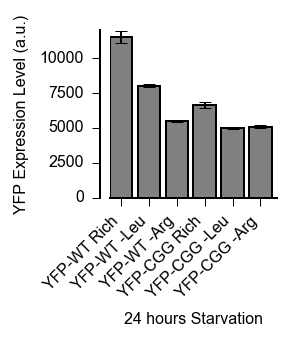

In [25]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, meanSubtractedData['mean'][sampleOrder], align='edge', color='grey' )
ax.errorbar(xlocations+0.4, meanSubtractedData['mean'][sampleOrder], meanSubtractedData['sterr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('24 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(meanSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'YFP Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_notnormalizedtorich.svg')
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_notnormalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_notnormalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

####  YFP mean expression after 24h Starvation, -tmp mean subtracted, normalized to rich condition mean within cell lines ####

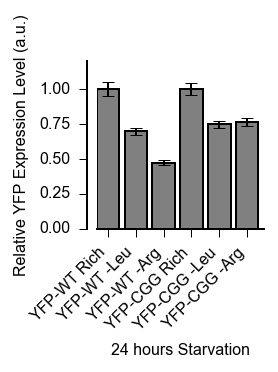

In [26]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, meanSubtractedData['normalizedMean'][sampleOrder], align='edge', color = 'grey' )
ax.errorbar(xlocations+0.4, meanSubtractedData['normalizedMean'][sampleOrder], meanSubtractedData['normalizedStdErr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('24 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(meanSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'Relative YFP Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_normalizedtorich.svg')
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_normalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmean_24h_minustmpsubtracted_normalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

####  YFP median expression after 24h Starvation, -tmp mean subtracted, normalized to rich condition mean within cell lines ####

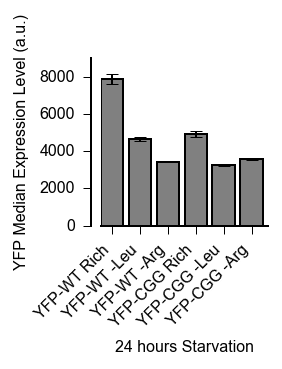

In [27]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, medianSubtractedData['mean'][sampleOrder], align='edge', color='grey' )
ax.errorbar(xlocations+0.4, medianSubtractedData['mean'][sampleOrder], medianSubtractedData['sterr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('24 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(medianSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'YFP Median Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_notnormalizedtorich.svg')
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_notnormalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_notnormalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

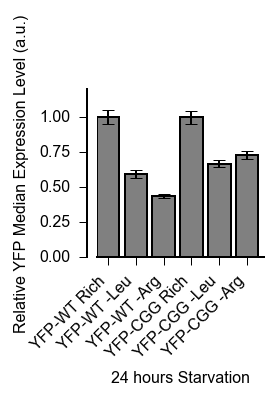

In [28]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, medianSubtractedData['normalizedMean'][sampleOrder], align='edge', color = 'grey' )
ax.errorbar(xlocations+0.4, medianSubtractedData['normalizedMean'][sampleOrder], medianSubtractedData['normalizedStdErr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('24 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(medianSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'Relative YFP Median Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_normalizedtorich.svg')
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_normalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmedian_24h_minustmpsubtracted_normalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

## Analysis 2 : consider mean of gated population of 30000 events after 38 h starvation ##

1) thresholding for reasonable FSC/SSC values and NO fluorescence value based thresholding, 
2) plus "no tmp" subtraction,
3) plus rich condition normalization ## 

In [29]:
fcsFiles = !ls ../fcs_files/20160413_38h/*.fcs

processeddata = dict()
for File in fcsFiles:
    print File
    ID = int( File.split( '/' )[-1].split( '.' )[0].split('_')[-1] )
    sampleid = sampleids[ID]
    fcsdata = FCMeasurement(ID= sampleid, datafile=File)
    fsc_threshold = 25000
    ssc_threshold = 12500
    processeddata[ sampleid ] = dict()
    subset = numpy.logical_and( fcsdata.data['FSC-A'] > fsc_threshold, fcsdata.data['SSC-A'] > ssc_threshold )
    processeddata[ sampleid ]['fsc_median'] = fcsdata.data['FSC-A'][subset].median()
    processeddata[ sampleid ]['fitc_mean'] = fcsdata.data['FITC-A'][subset].mean()
    processeddata[ sampleid ]['fitc_median'] = fcsdata.data['FITC-A'][subset].median()
    processeddata[ sampleid ]['fitc_q25'] = fcsdata.data['FITC-A'][subset].quantile(q=0.25)    
    processeddata[ sampleid ]['fitc_q75'] = fcsdata.data['FITC-A'][subset].quantile(q=0.75)
    processeddata[ sampleid ]['fsc_q25'] = fcsdata.data['FSC-A'][subset].quantile(q=0.25)    
    processeddata[ sampleid ]['fsc_q75'] = fcsdata.data['FSC-A'][subset].quantile(q=0.75)        

../fcs_files/20160413_38h/Specimen_001_Tube_001.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_002.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_003.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_004.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_005.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_006.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_007.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_008.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_009.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_010.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_011.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_012.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_013.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_014.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_015.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_016.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_017.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_018.fcs
../fcs_files/20160413_38h/Specimen_001_Tube_019.fcs
../fcs_files

In [30]:
data = pandas.DataFrame.from_dict( processeddata, orient='index' )

In [31]:
data['samplelabel'] = data.index
data['samplelabel'] = map( lambda x: ' '.join(x.split(' ')[:-1]), data['samplelabel'])
groupeddata = data.groupby( ['samplelabel'] )
#can only run this once!

In [32]:
summarizedData = groupeddata['fitc_mean'].agg([numpy.mean, numpy.std]) #take mean of 3 population means
medianSummarizedData = groupeddata['fitc_median'].agg([numpy.mean, numpy.std]) #take mean of 3 population medians

In [33]:
tmpsamples = map( lambda x: x.find('NOTMP') == -1, summarizedData.index)
summarizedDataTmp = summarizedData[tmpsamples]
summarizedDataNoTmp = summarizedData[numpy.logical_not(tmpsamples)]
summarizedDataNoTmp.index = map( lambda x: x.replace(' NOTMP',''), summarizedDataNoTmp.index)
summarizedDataTmp.index = map( lambda x: x.replace(' TMP',''), summarizedDataTmp.index)

medianSummarizedDataTmp = medianSummarizedData[tmpsamples]
medianSummarizedDataNoTmp = medianSummarizedData[numpy.logical_not(tmpsamples)]
medianSummarizedDataNoTmp.index = map( lambda x: x.replace(' NOTMP',''), medianSummarizedDataNoTmp.index)
medianSummarizedDataTmp.index = map( lambda x: x.replace(' TMP',''), medianSummarizedDataTmp.index)

In [34]:
meanSubtractedData = pandas.DataFrame()
meanSubtractedData['mean'] = summarizedDataTmp['mean'] - summarizedDataNoTmp['mean']
meanSubtractedData['std'] = numpy.sqrt(numpy.square(summarizedDataTmp['std']) + numpy.square(summarizedDataNoTmp['std']))

medianSubtractedData = pandas.DataFrame()
medianSubtractedData['mean'] = medianSummarizedDataTmp['mean'] - medianSummarizedDataNoTmp['mean']
medianSubtractedData['std'] = numpy.sqrt(numpy.square(medianSummarizedDataTmp['std']) + numpy.square(medianSummarizedDataNoTmp['std']))

In [35]:
meanSubtractedData['normalizedMean'] = map(lambda row: 
                                           row[1]['mean']/meanSubtractedData.ix['YFP-CGG Rich']['mean'] 
                                           if row[0].find('YFP-CGG') != -1
                                           else row[1]['mean']/meanSubtractedData.ix['YFP-WT Rich']['mean']
                                           , meanSubtractedData.iterrows())
meanSubtractedData['normalizedStd'] = map(lambda row: row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(meanSubtractedData.ix['YFP-CGG Rich']['std'] / 
                                          meanSubtractedData.ix['YFP-CGG Rich']['mean']) )
                                           if row[0].find('CGG') != -1
                                           else row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(meanSubtractedData.ix['YFP-WT Rich']['std'] / 
                                          meanSubtractedData.ix['YFP-WT Rich']['mean']) )
                                           , meanSubtractedData.iterrows())
meanSubtractedData['normalizedStdErr'] = meanSubtractedData['normalizedStd'] / numpy.sqrt(3)
meanSubtractedData['sterr'] = meanSubtractedData['std'] / numpy.sqrt(3)

In [36]:
medianSubtractedData['normalizedMean'] = map(lambda row: 
                                           row[1]['mean']/medianSubtractedData.ix['YFP-CGG Rich']['mean'] 
                                           if row[0].find('CGG') != -1
                                           else row[1]['mean']/medianSubtractedData.ix['YFP-WT Rich']['mean']
                                           , medianSubtractedData.iterrows())
medianSubtractedData['normalizedStd'] = map(lambda row: row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(medianSubtractedData.ix['YFP-CGG Rich']['std'] / 
                                          medianSubtractedData.ix['YFP-CGG Rich']['mean']) )
                                           if row[0].find('CGG') != -1
                                           else row[1]['normalizedMean'] * numpy.sqrt(
                                           numpy.square(row[1]['std']/row[1]['mean']) +
                                          numpy.square(medianSubtractedData.ix['YFP-WT Rich']['std'] / 
                                          medianSubtractedData.ix['YFP-WT Rich']['mean']) )
                                           , medianSubtractedData.iterrows())
medianSubtractedData['normalizedStdErr'] = medianSubtractedData['normalizedStd'] / numpy.sqrt(3)
medianSubtractedData['sterr'] = medianSubtractedData['std'] / numpy.sqrt(3)

####  YFP mean expression after 38h Starvation, -tmp mean subtracted, NOT normalized to rich condition mean within cell lines ####

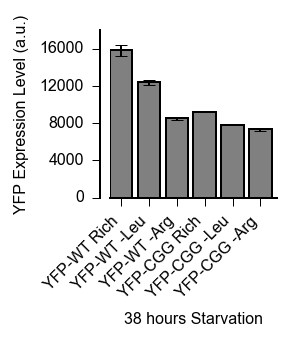

In [37]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, meanSubtractedData['mean'][sampleOrder], align='edge', color='grey' )
ax.errorbar(xlocations+0.4, meanSubtractedData['mean'][sampleOrder], meanSubtractedData['sterr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('38 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(meanSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'YFP Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_notnormalizedtorich.svg')
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_notnormalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_notnormalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

####  YFP mean expression after 38h Starvation, -tmp mean subtracted, normalized to rich condition mean within cell lines ####

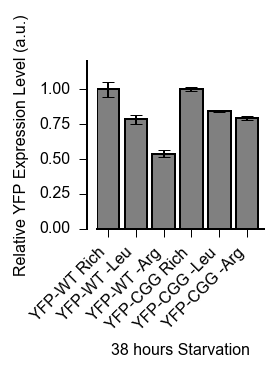

In [38]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, meanSubtractedData['normalizedMean'][sampleOrder], align='edge', color = 'grey' )
ax.errorbar(xlocations+0.4, meanSubtractedData['normalizedMean'][sampleOrder], meanSubtractedData['normalizedStdErr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('38 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(meanSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'Relative YFP Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_normalizedtorich.svg')
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_normalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmean_38h_minustmpsubtracted_normalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

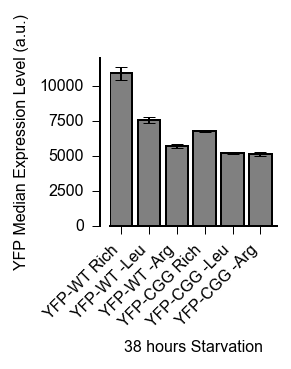

In [39]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, medianSubtractedData['mean'][sampleOrder], align='edge', color='grey' )
ax.errorbar(xlocations+0.4, medianSubtractedData['mean'][sampleOrder], medianSubtractedData['sterr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('38 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(medianSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'YFP Median Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_notnormalizedtorich.svg')
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_notnormalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_notnormalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

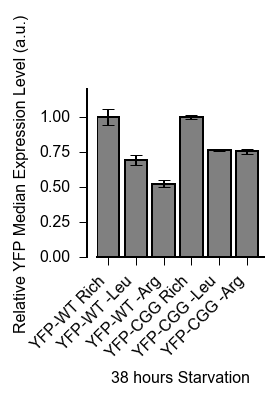

In [40]:
fig = plt.figure()
ax = fig.add_subplot(111)
matplotlib.rcParams['savefig.dpi'] = 144

sampleOrder = numpy.array([5,4,3,2,1,0])

xlocations = numpy.array([0,1,2,3,4,5])

ax.bar(xlocations, medianSubtractedData['normalizedMean'][sampleOrder], align='edge', color = 'grey' )
ax.errorbar(xlocations+0.4, medianSubtractedData['normalizedMean'][sampleOrder], medianSubtractedData['normalizedStdErr'][sampleOrder], linestyle = 'None', color = 'black' )

spineOffset = {'left': 5, 'bottom': 0}    
[ spine.set_position(('outward',spineOffset[loc])) if loc in ['left','bottom'] 
     else spine.set_color('none') for loc, spine in ax.spines.items() ]         
ax.xaxis.set( ticks_position = 'bottom')
ax.yaxis.set( ticks_position = 'left')
ax.yaxis.set( major_locator = MaxNLocator(5) )

ax.set_xlabel('38 hours Starvation')
ax.set_xticks(xlocations+0.4)
ax.set_xticklabels(medianSubtractedData.index[sampleOrder], rotation=45, ha='right')

ax.set_ylabel( 'Relative YFP Median Expression Level (a.u.)')

fig.set_size_inches([0.25*len(xlocations),1.5])
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_normalizedtorich.svg')
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_normalizedtorich.png',bbox_inches='tight')
fig.savefig('../figures/yfpmedian_38h_minustmpsubtracted_normalizedtorich.pdf',bbox_inches='tight',pad_inches=0.1)

## Analysis v2 :  examining histograms & scatterplots of log-transformed data with FLowCytometryTools to determine gates ##

/Users/aliciadarnell/anaconda2/envs/py27/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


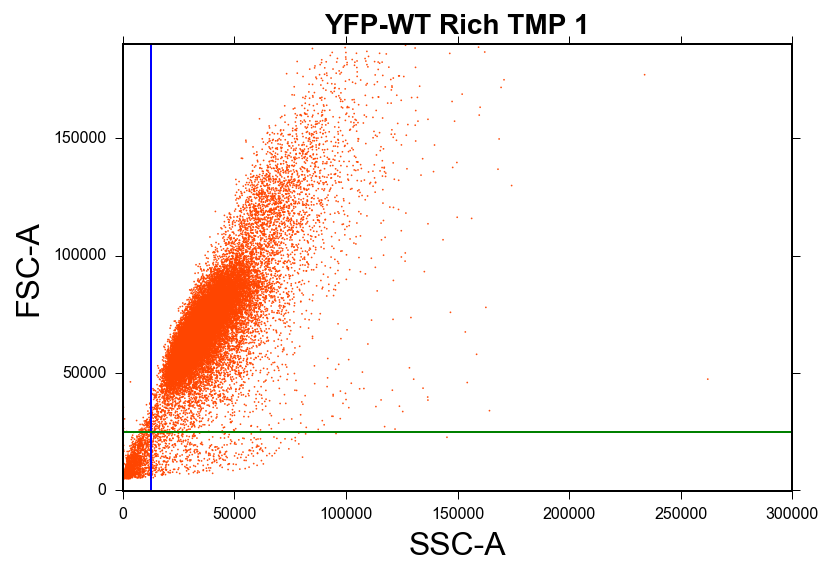

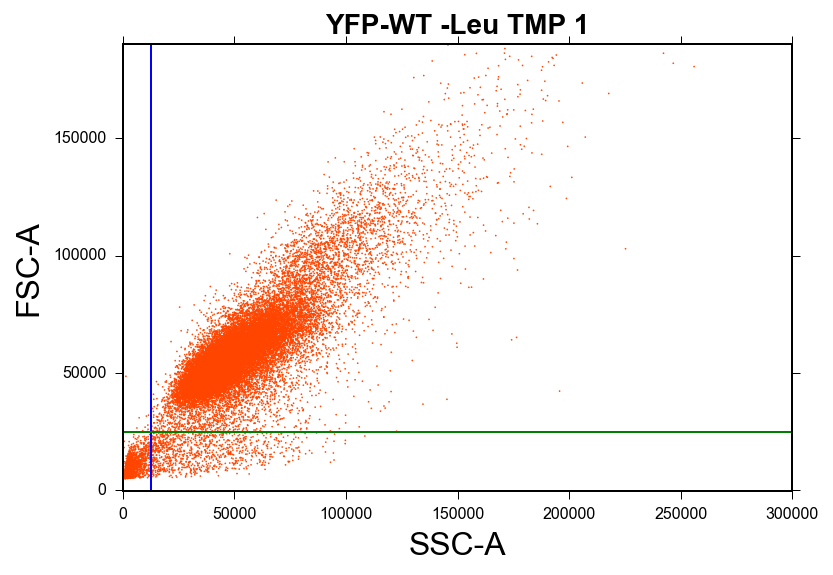

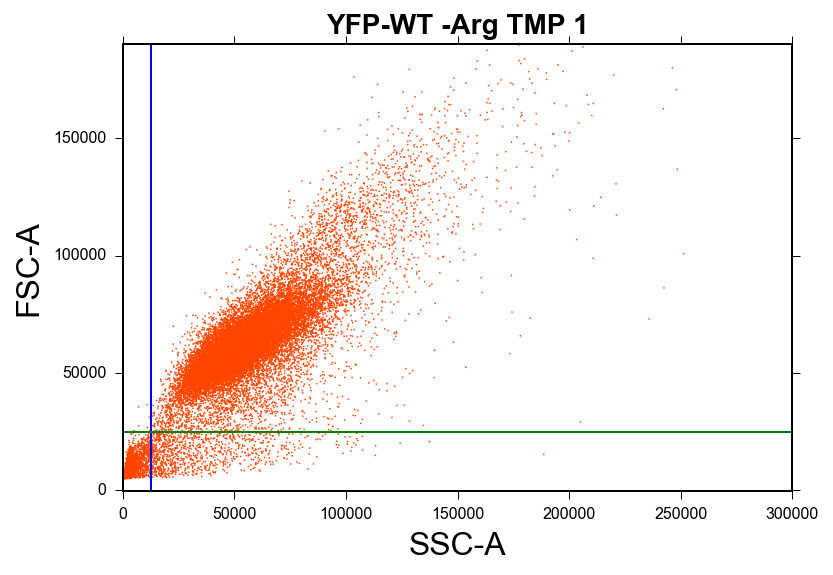

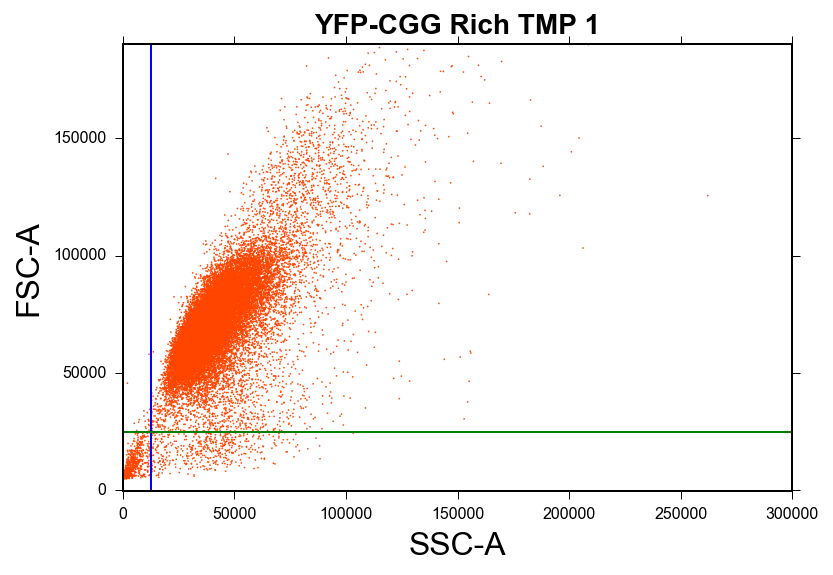

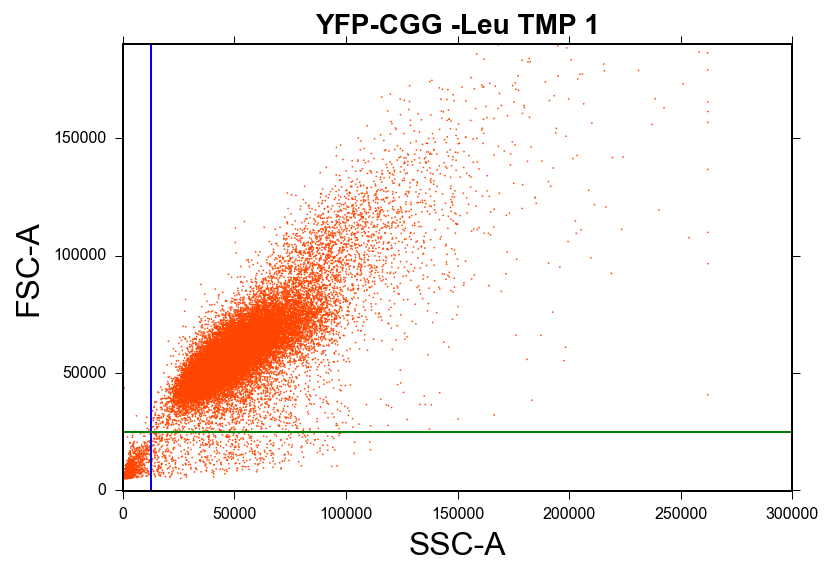

...

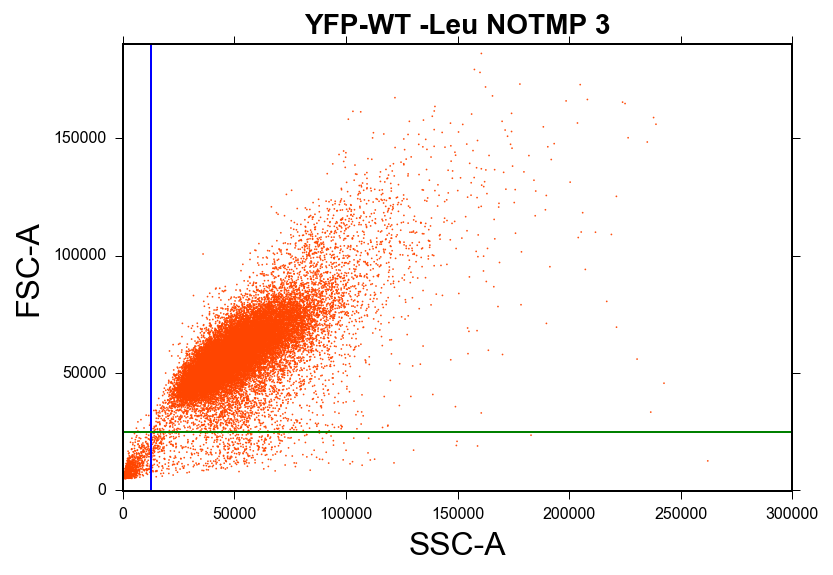

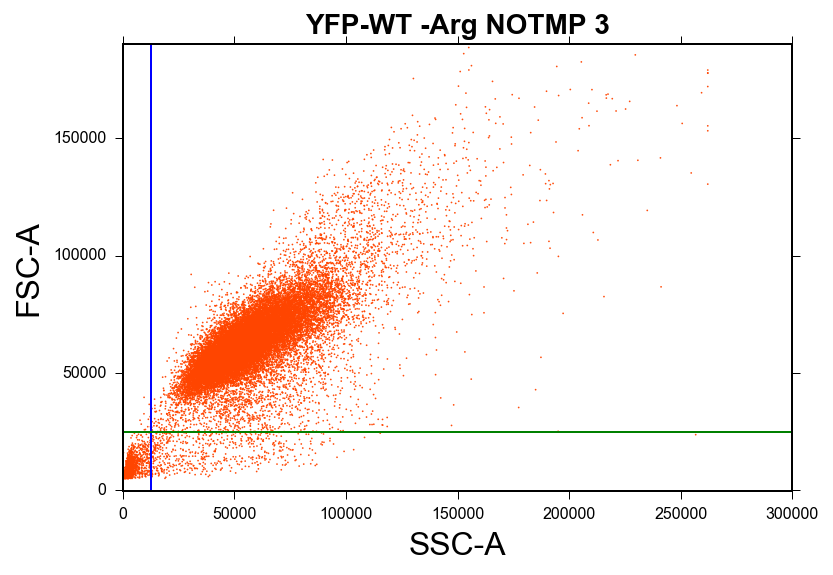

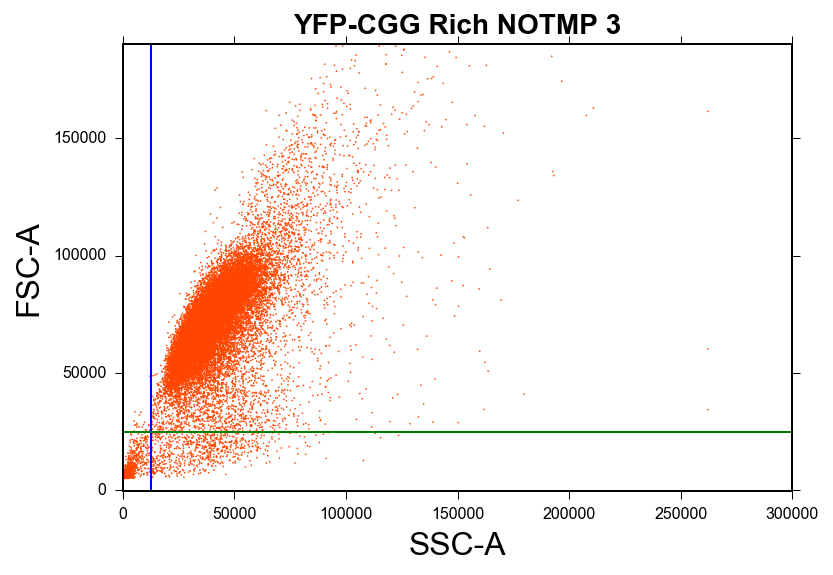

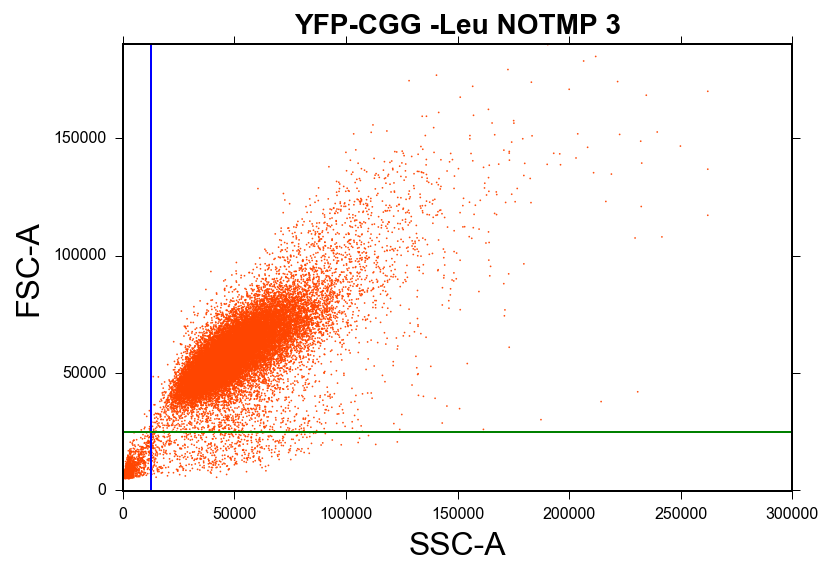

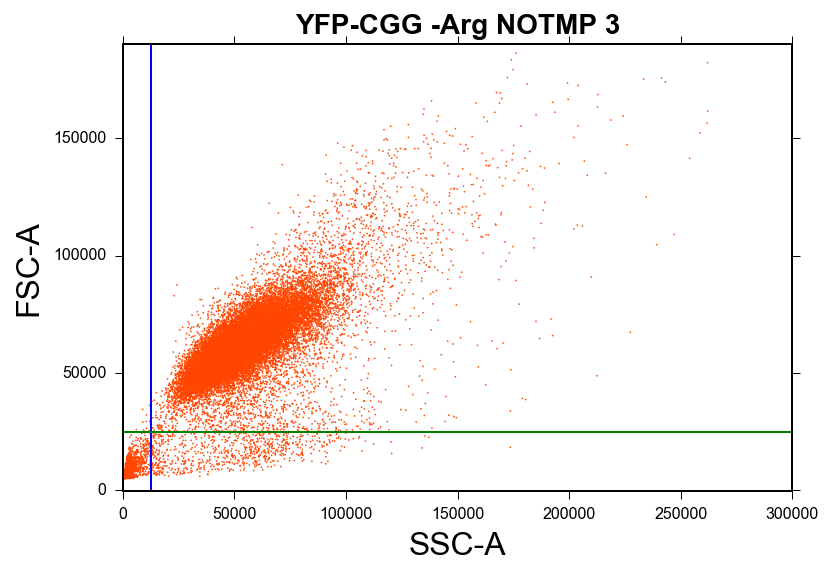

In [41]:
import os, FlowCytometryTools
from FlowCytometryTools import FCMeasurement
from FlowCytometryTools import ThresholdGate
from pylab import *

fcsFiles = !ls ../fcs_files/20160411_24h/*.fcs

for File in fcsFiles:
    ID = int( File.split( '/' )[-1].split( '.' )[0].split('_')[-1] )
    sampleid = sampleids[ID]
    plotsample = FCMeasurement(ID= sampleid, datafile=File)
    #print plotsample.ID
    #print plotsample.channel_names  #names of lasers
    #print plotsample.channels  #useful: gives voltage values for all channels so I can keep this consisent 
    #print type(plotsample.data) #this is a pandas data frame with entries for fsc,ssc, and each laser, and time. 
    #print plotsample.data[['FITC-A', 'PE-A']][:10]  #this prints the 1st 10 entries in each column for FITC/mCherry values
    #plotdata = plotsample.data
    #print plotdata['FITC-A'].describe()   #this prints overall statistics about the data for this sample.
    #print plotdata['FITC-A'].median()
    #print plotdata['PE-A'].median()
    #print plotdata.shape[0] #how many events are in the data"tube"
    
    #define gates based on visual analysis of scatter plot
    fsc_gate = ThresholdGate(25000.0, 'FSC-A', region='above')
    ssc_gate = ThresholdGate(12500.0, 'SSC-A', region='above')
    
    tsample = plotsample.transform('hlog', channels=['FITC-A'], b=200)   # b controls the location where the transformation shifts from linear to log. The optimal value for this parameter depends on the range of your data. For smaller ranges, try smaller values of b. So if your population doesn’t show up well, just adjust b.
    axTitle = plotsample.ID
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_ylim(-100,190000)
    ax.set_xlim(-100,300000)
    ax.set_title( axTitle, fontsize=14, fontweight='bold')
    #tsample.plot('FITC-A', color='green', bins=100) #plots a 1D histogram of FITC
    tsample.plot(['SSC-A', 'FSC-A'], kind='scatter', color='orangered', gates=[ssc_gate, fsc_gate], s=0.75, alpha = 0.95) #plots a 2d scatter plot. s value adjusts the weight of each point. alpha adjusts the transparency of each point between 1 and 0

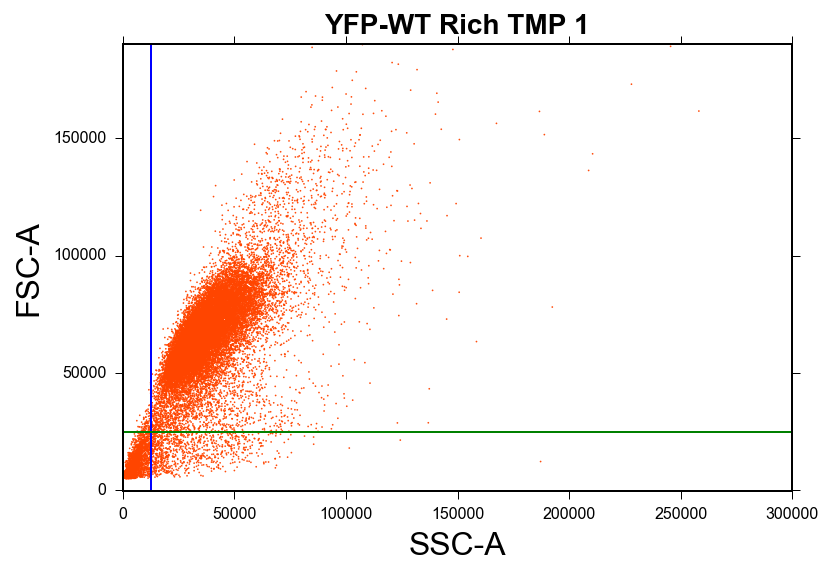

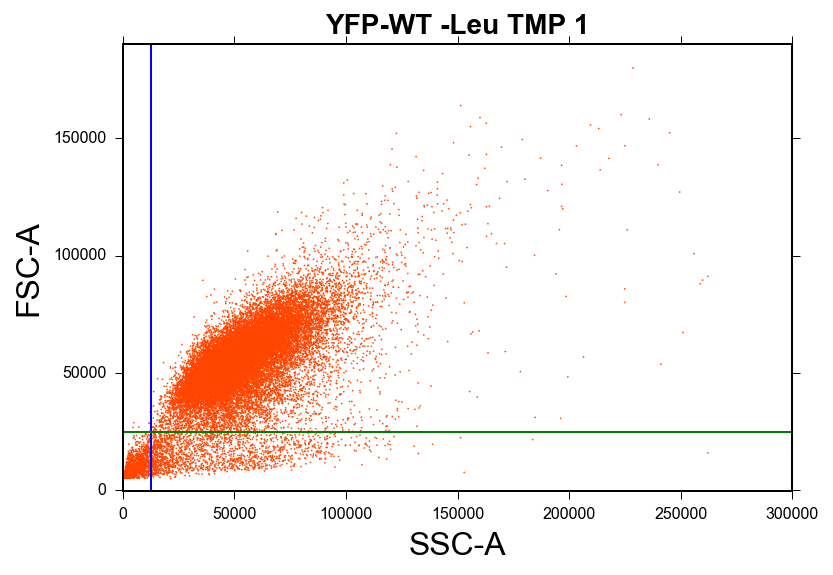

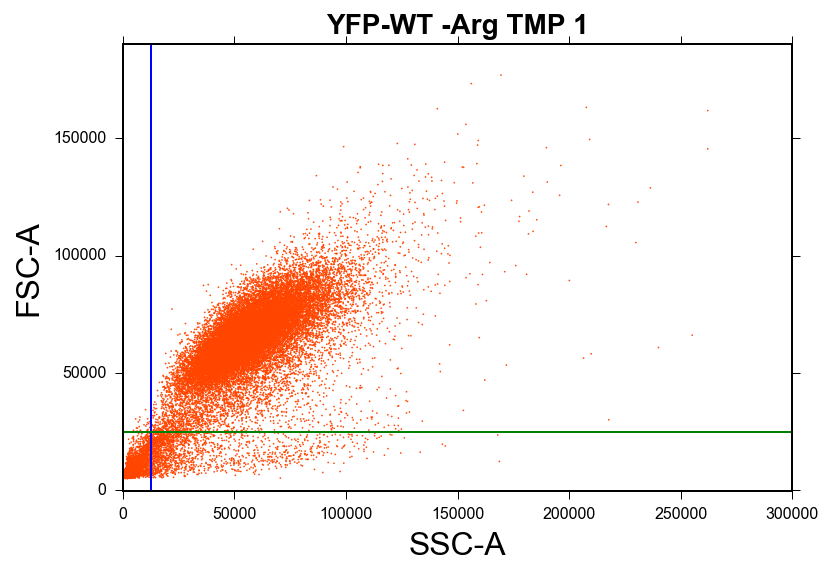

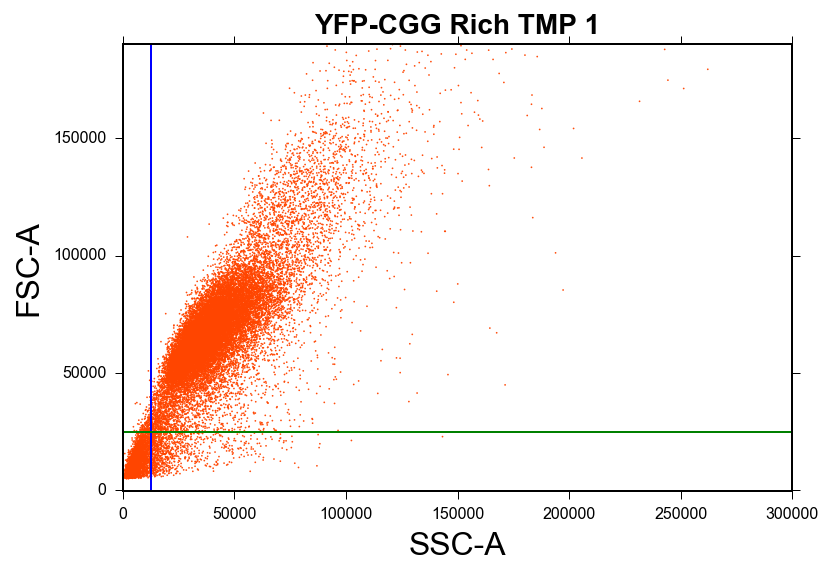

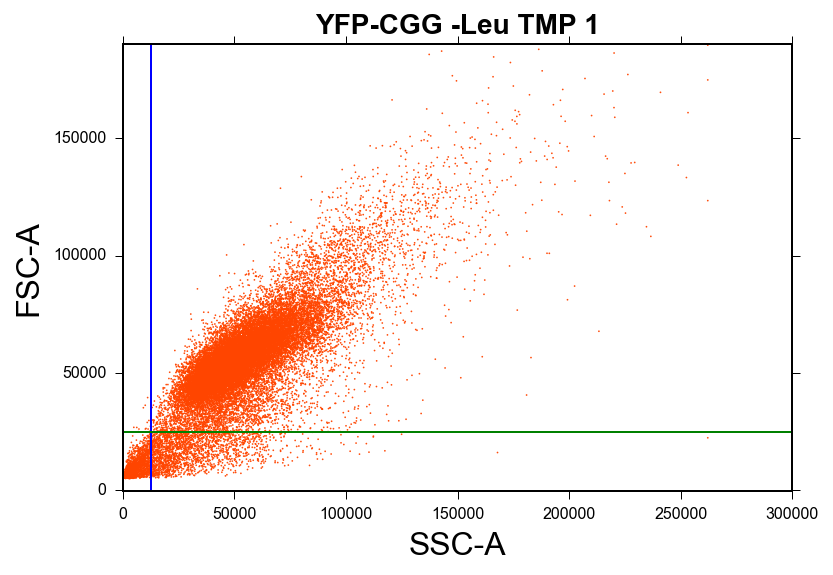

...

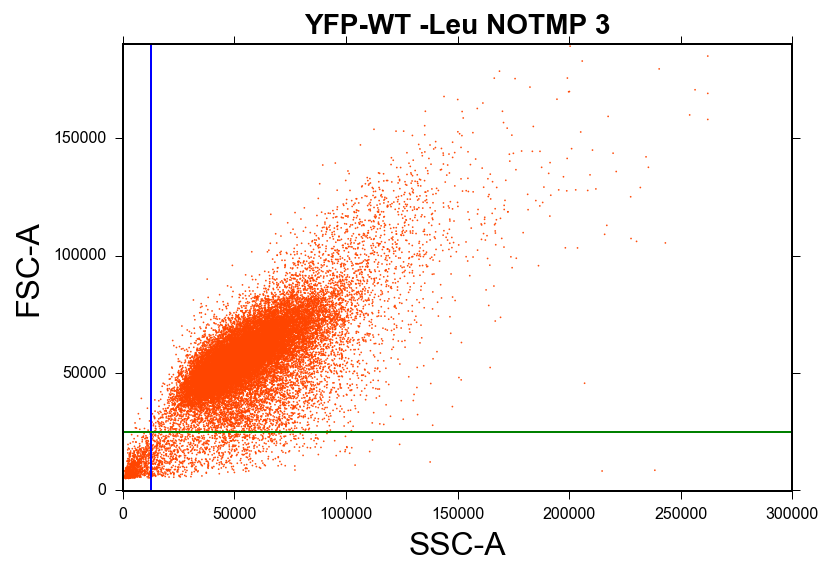

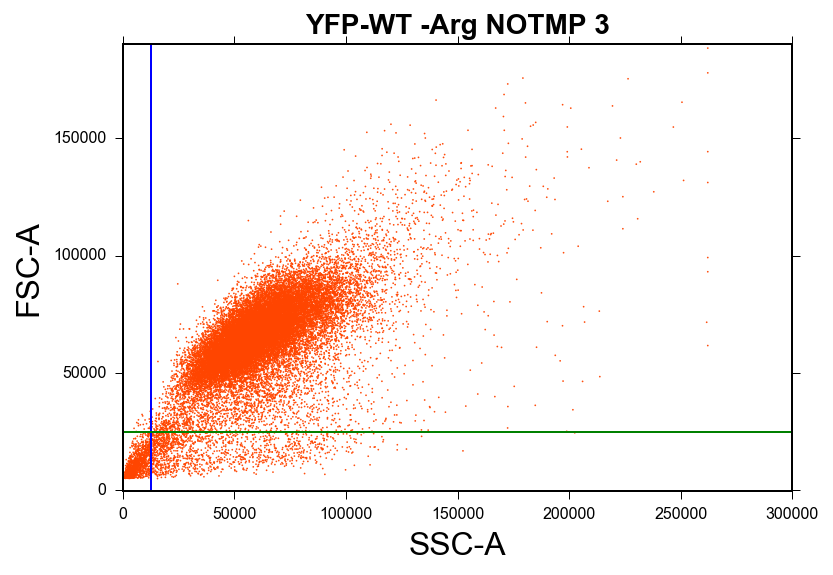

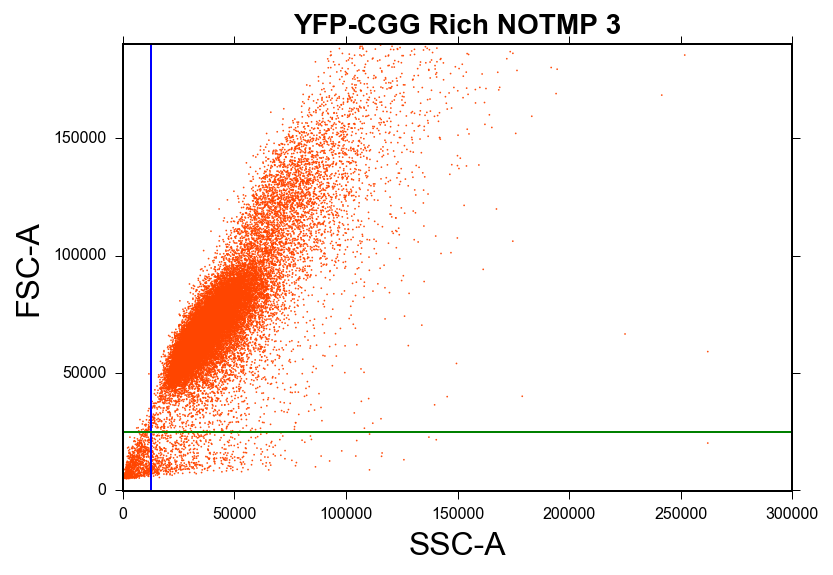

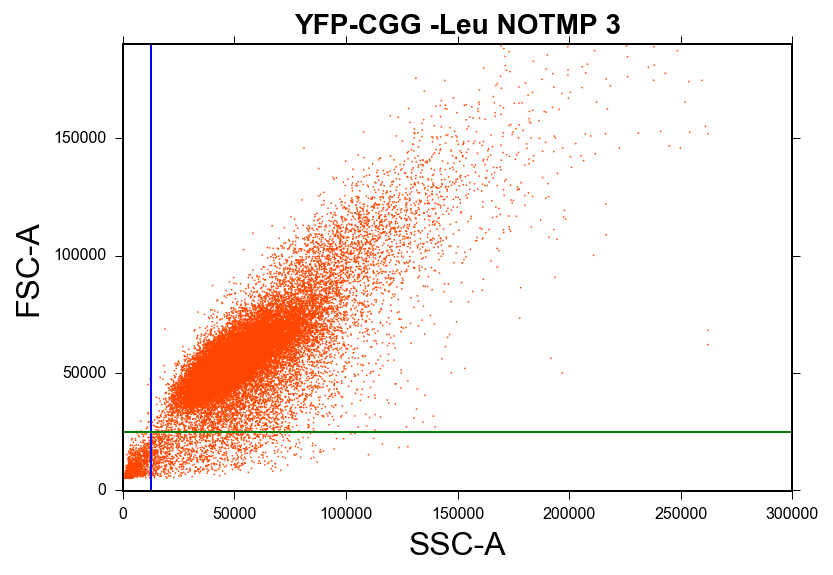

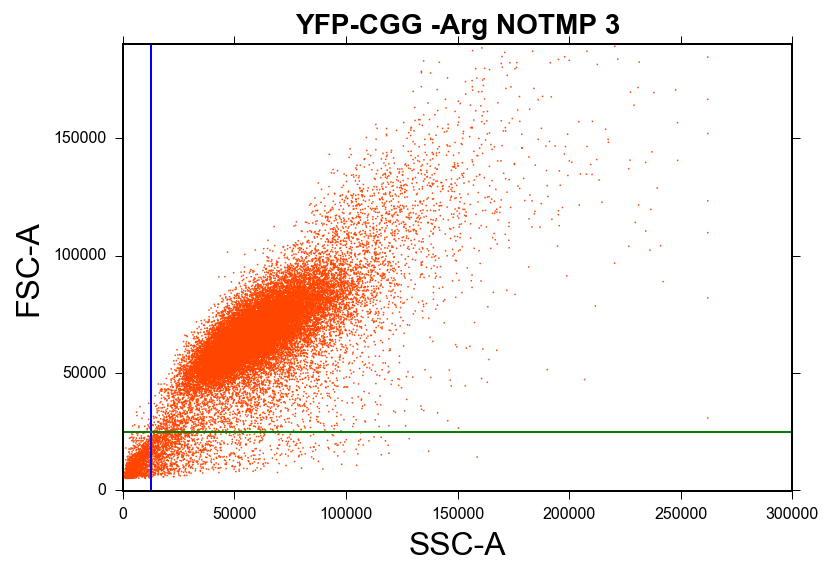

In [42]:
import os, FlowCytometryTools
from FlowCytometryTools import FCMeasurement
from FlowCytometryTools import ThresholdGate
from pylab import *

fcsFiles = !ls ../fcs_files/20160413_38h/*.fcs

for File in fcsFiles:
    ID = int( File.split( '/' )[-1].split( '.' )[0].split('_')[-1] )
    sampleid = sampleids[ID]
    plotsample = FCMeasurement(ID= sampleid, datafile=File)
    #print plotsample.ID
    #print plotsample.channel_names  #names of lasers
    #print plotsample.channels  #useful: gives voltage values for all channels so I can keep this consisent 
    #print type(plotsample.data) #this is a pandas data frame with entries for fsc,ssc, and each laser, and time. 
    #print plotsample.data[['FITC-A', 'PE-A']][:10]  #this prints the 1st 10 entries in each column for FITC/mCherry values
    #plotdata = plotsample.data
    #print plotdata['FITC-A'].describe()   #this prints overall statistics about the data for this sample.
    #print plotdata['FITC-A'].median()
    #print plotdata['PE-A'].median()
    #print plotdata.shape[0] #how many events are in the data"tube"
    
    #define gates based on visual analysis of scatter plot
    fsc_gate = ThresholdGate(25000.0, 'FSC-A', region='above')
    ssc_gate = ThresholdGate(12500.0, 'SSC-A', region='above')
    
    tsample = plotsample.transform('hlog', channels=['FITC-A'], b=200)   # b controls the location where the transformation shifts from linear to log. The optimal value for this parameter depends on the range of your data. For smaller ranges, try smaller values of b. So if your population doesn’t show up well, just adjust b.
    axTitle = plotsample.ID
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_ylim(-100,190000)
    ax.set_xlim(-100,300000)
    ax.set_title( axTitle, fontsize=14, fontweight='bold')
    #tsample.plot('FITC-A', color='green', bins=100) #plots a 1D histogram of FITC
    tsample.plot(['SSC-A', 'FSC-A'], kind='scatter', color='orangered', gates=[ssc_gate, fsc_gate], s=0.75, alpha = 0.95) #plots a 2d scatter plot. s value adjusts the weight of each point. alpha adjusts the transparency of each point between 1 and 0

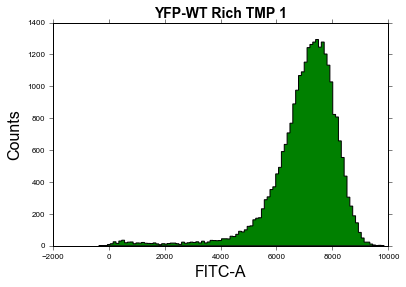

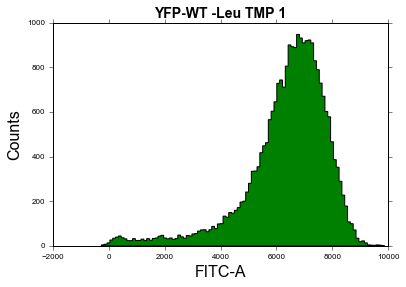

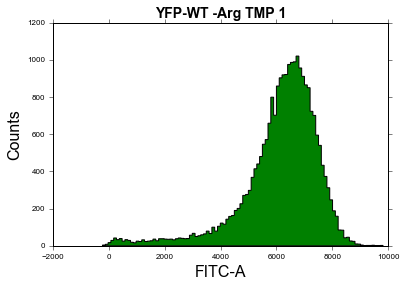

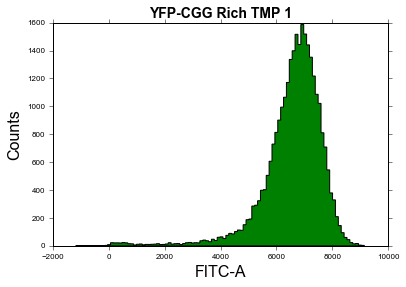

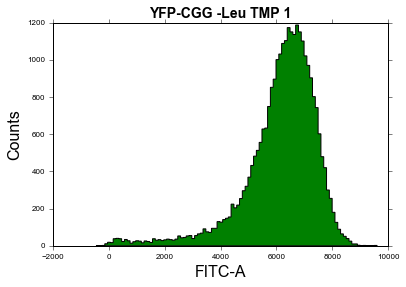

...

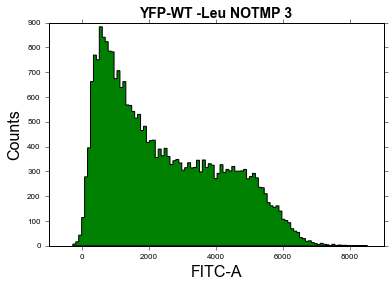

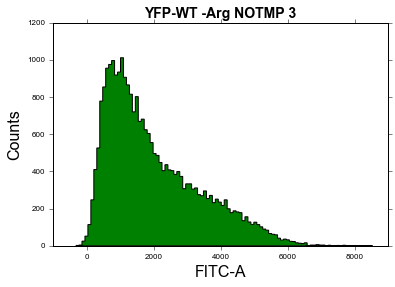

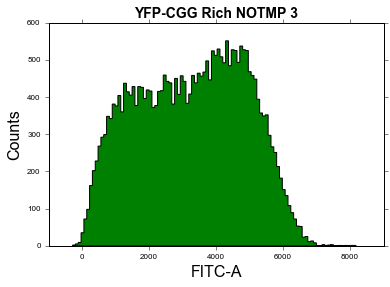

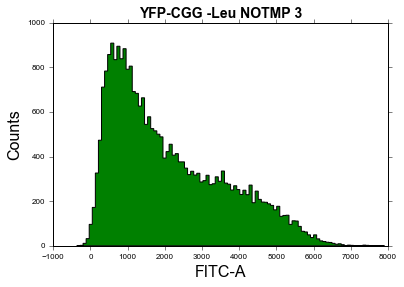

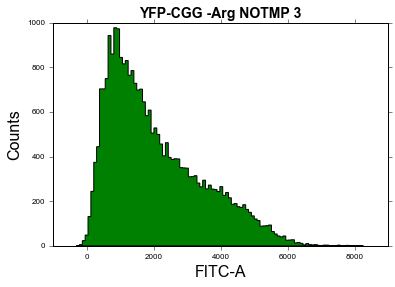

In [5]:
import os, FlowCytometryTools
from FlowCytometryTools import FCMeasurement
from FlowCytometryTools import ThresholdGate
from pylab import *

fcsFiles = !ls ../fcs_files/20160411_24h/*fcs

for File in fcsFiles:
    ID = int( File.split( '/' )[-1].split( '.' )[0].split('_')[-1] )
    sampleid = sampleids[ID]
    plotsample = FCMeasurement(ID= sampleid, datafile=File)
    
    #define gates based on visual analysis of scatter plot
    fsc_gate = ThresholdGate(25000.0, 'FSC-A', region='above')
    ssc_gate = ThresholdGate(12500.0, 'SSC-A', region='above')
    
    tsample = plotsample.transform('hlog', channels=['FITC-A'], b=200)   # b controls the location where the transformation shifts from linear to log. The optimal value for this parameter depends on the range of your data. For smaller ranges, try smaller values of b. So if your population doesn’t show up well, just adjust b.
    axTitle = plotsample.ID
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.set_title( axTitle, fontsize=14, fontweight='bold')
    gated_sample = tsample.gate(fsc_gate,ssc_gate)
    gated_sample.plot('FITC-A', color='green', bins=100)
    
    #tsample.plot(['SSC-A', 'FSC-A'], kind='scatter', color='orangered', gates=[ssc_gate, fsc_gate], s=0.75, alpha = 0.95) #plots a 2d scatter plot. s value adjusts the weight of each point. alpha adjusts the transparency of each point between 1 and 0